In [1]:
import pandas as pd
import numpy as np
import math
import time
import matplotlib.pyplot as plt
from math import sqrt
import seaborn as sns
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn import model_selection
from sklearn.model_selection import cross_val_score
from sklearn.tree import export_graphviz
# from sklearn.externals.six import StringIO
from six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, make_scorer, recall_score, roc_auc_score, average_precision_score

pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None) 
pd.set_option('display.float_format', lambda x: '%.6f' % x)
pd.options.mode.chained_assignment = None  # default='warn'

import warnings
from sklearn.exceptions import DataConversionWarning
warnings.filterwarnings(action='ignore', category=DataConversionWarning)

In [2]:
ins_file = 'data'
ext = '.csv'

data = pd.read_csv(ins_file+ext)

In [3]:
# Data Wrangling
data.head(20)
data.isnull().sum()
data.nunique()
data['Churn'].value_counts()
data.dtypes
data.columns

Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

In [5]:
# Categorically Enconding each column with numbers to analyse the best features with a Heat Map. Also allows for better 
# accuracy in Tree Classifiers.
encoder = OrdinalEncoder()

data["gender_code"] = encoder.fit_transform(data['gender'].values.reshape(-1, 1)).astype('int64')
data["Partner_code"] = encoder.fit_transform(data.Partner.values.reshape(-1, 1)).astype('int64')
data["Dependents_code"] = encoder.fit_transform(data.Dependents.values.reshape(-1, 1)).astype('int64')
data["PhoneService_code"] = encoder.fit_transform(data.PhoneService.values.reshape(-1, 1)).astype('int64')
data["MultipleLines_code"] = encoder.fit_transform(data.MultipleLines.values.reshape(-1, 1)).astype('int64')
data["InternetService_code"] = encoder.fit_transform(data.InternetService.values.reshape(-1, 1)).astype('int64')
data["OnlineSecurity_code"] = encoder.fit_transform(data.OnlineSecurity.values.reshape(-1, 1)).astype('int64')
data["OnlineBackup_code"] = encoder.fit_transform(data.OnlineBackup.values.reshape(-1, 1)).astype('int64')
data["DeviceProtection_code"] = encoder.fit_transform(data.DeviceProtection.values.reshape(-1, 1)).astype('int64')
data["TechSupport_code"] = encoder.fit_transform(data.TechSupport.values.reshape(-1, 1)).astype('int64')
data["StreamingTV_code"] = encoder.fit_transform(data.StreamingTV.values.reshape(-1, 1)).astype('int64')
data["StreamingMovies_code"] = encoder.fit_transform(data.StreamingMovies.values.reshape(-1, 1)).astype('int64')
data["Contract_code"] = encoder.fit_transform(data.Contract.values.reshape(-1, 1)).astype('int64')
data["PaperlessBilling_code"] = encoder.fit_transform(data.PaperlessBilling.values.reshape(-1, 1)).astype('int64')
data["PaymentMethod_code"] = encoder.fit_transform(data.PaymentMethod.values.reshape(-1, 1)).astype('int64')
data["Churn_code"] = encoder.fit_transform(data.Churn.values.reshape(-1, 1)).astype('int64')

# data

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,gender_code,Partner_code,Dependents_code,PhoneService_code,MultipleLines_code,InternetService_code,OnlineSecurity_code,OnlineBackup_code,DeviceProtection_code,TechSupport_code,StreamingTV_code,StreamingMovies_code,Contract_code,PaperlessBilling_code,PaymentMethod_code,Churn_code
0,0002-ORFBO,Female,0,Yes,Yes,9,Yes,No,DSL,No,Yes,No,Yes,Yes,No,One year,Yes,Mailed check,65.600000,593.300000,No,0,1,1,1,0,0,0,2,0,2,2,0,1,1,3,0
1,0003-MKNFE,Male,0,No,No,9,Yes,Yes,DSL,No,No,No,No,No,Yes,Month-to-month,No,Mailed check,59.900000,542.400000,No,1,0,0,1,2,0,0,0,0,0,0,2,0,0,3,0
2,0004-TLHLJ,Male,1,No,No,4,Yes,No,Fiber optic,No,No,Yes,No,No,No,Month-to-month,Yes,Electronic check,73.900000,280.850000,Yes,1,0,0,1,0,1,0,0,2,0,0,0,0,1,2,1
3,0011-IGKFF,Male,1,Yes,No,13,Yes,No,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,98.000000,1237.850000,Yes,1,1,0,1,0,1,0,2,2,0,2,2,0,1,2,1
4,0013-EXCHZ,Female,1,Yes,No,3,Yes,No,Fiber optic,No,No,No,Yes,Yes,No,Month-to-month,Yes,Mailed check,83.900000,267.400000,Yes,0,1,0,1,0,1,0,0,0,2,2,0,0,1,3,1
5,0013-MHZWF,Female,0,No,Yes,9,Yes,No,DSL,No,No,No,Yes,Yes,Yes,Month-to-month,Yes,Credit card (automatic),69.400000,571.450000,No,0,0,1,1,0,0,0,0,0,2,2,2,0,1,1,0
6,0013-SMEOE,Female,1,Yes,No,71,Yes,No,Fiber optic,Yes,Yes,Yes,Yes,Yes,Yes,Two year,Yes,Bank transfer (automatic),109.700000,7904.250000,No,0,1,0,1,0,1,2,2,2,2,2,2,2,1,0,0
7,0014-BMAQU,Male,0,Yes,No,63,Yes,Yes,Fiber optic,Yes,No,No,Yes,No,No,Two year,Yes,Credit card (automatic),84.650000,5377.800000,No,1,1,0,1,2,1,2,0,0,2,0,0,2,1,1,0
8,0015-UOCOJ,Female,1,No,No,7,Yes,No,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Electronic check,48.200000,340.350000,No,0,0,0,1,0,0,2,0,0,0,0,0,0,1,2,0
9,0016-QLJIS,Female,0,Yes,Yes,65,Yes,Yes,DSL,Yes,Yes,Yes,Yes,Yes,Yes,Two year,Yes,Mailed check,90.450000,5957.900000,No,0,1,1,1,2,0,2,2,2,2,2,2,2,1,3,0


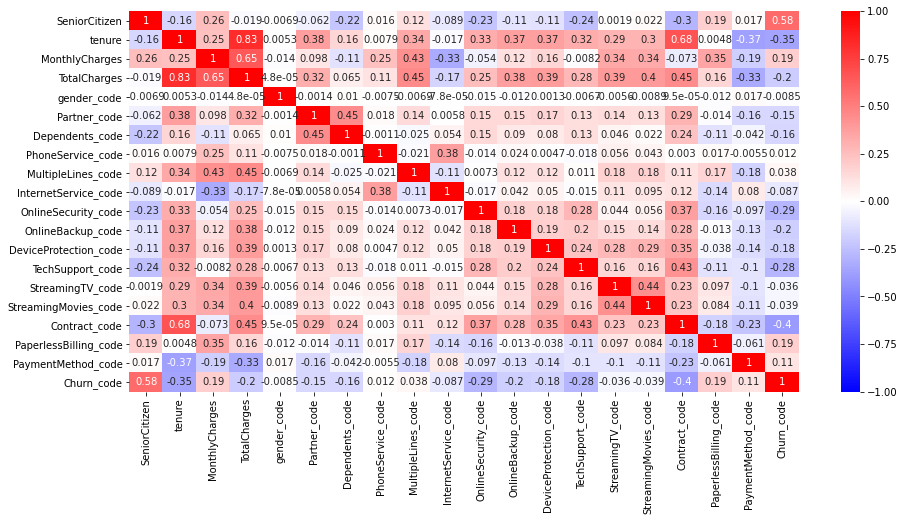

In [6]:
# Make a heatmap on the correlations between variables in the hotel data:
data_correlations = data.corr()
data_correlations
plt.figure(figsize=(15,7))
fig = sns.heatmap(data_correlations, vmin = -1, vmax = 1, cmap = 'bwr', annot=True)
fig.figure.savefig("output2.png")

In [8]:
# Features columns chosen for prediction.
feature_cols = ['SeniorCitizen','tenure','MonthlyCharges','TotalCharges','Partner_code','Dependents_code','OnlineSecurity_code',
               'OnlineBackup_code', 'DeviceProtection_code','TechSupport_code','Contract_code','PaperlessBilling_code','PaymentMethod_code']

# Assigning Feature columns to X and y for Test Train Split
X = data[feature_cols]
y = data[['Churn']]

X_train, X_test, y_train, y_test = train_test_split(X, y,random_state=99)

y

,Churn
0,No
1,No
2,Yes
3,Yes
4,Yes
5,No
6,No
7,No
8,No
9,No


In [ ]:
# Grid Search CV with various Hyperparameters to determine best Model.
params = {'n_estimators': [100,150,200],'criterion': ['gini', 'entropy'], 'bootstrap': [True, False], 
          'min_samples_leaf': [10, 20, 30, 40], 'max_depth': [10, 20, 30, 40]}

grid_search_cv = GridSearchCV(RandomForestClassifier(), params, cv=5)
grid_search_cv.fit(X_train, y_train)

In [120]:
print(grid_search_cv.best_estimator_)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=10, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=10, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


In [143]:
best_model_task2 = RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=50, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=30, min_samples_split=5,
                       min_weight_fraction_leaf=0.03, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=90,
                       verbose=0, warm_start=False)

kf = model_selection.KFold(n_splits=10,shuffle=True)

In [153]:
best_model_task2.fit(X_train,y_train)
y_pred = best_model_task2.predict(X_test)

accuracy = cross_val_score(best_model_task2, X_test, y_test, cv=kf, scoring='accuracy')
roc_auc = cross_val_score(best_model_task2, X_test, y_test, cv=kf, scoring='roc_auc')

print(np.mean(accuracy)*100)
print(np.mean(roc_auc))
print(classification_report(y_test,y_pred))

85.3805194805195
0.8985970798243592
              precision    recall  f1-score   support

          No       0.88      0.94      0.91      1299
         Yes       0.80      0.63      0.70       459

    accuracy                           0.86      1758
   macro avg       0.84      0.79      0.81      1758
weighted avg       0.86      0.86      0.86      1758



In [148]:
metrics.SCORERS.keys()

dict_keys(['explained_variance', 'r2', 'max_error', 'neg_median_absolute_error', 'neg_mean_absolute_error', 'neg_mean_squared_error', 'neg_mean_squared_log_error', 'accuracy', 'roc_auc', 'balanced_accuracy', 'average_precision', 'neg_log_loss', 'brier_score_loss', 'adjusted_rand_score', 'homogeneity_score', 'completeness_score', 'v_measure_score', 'mutual_info_score', 'adjusted_mutual_info_score', 'normalized_mutual_info_score', 'fowlkes_mallows_score', 'precision', 'precision_macro', 'precision_micro', 'precision_samples', 'precision_weighted', 'recall', 'recall_macro', 'recall_micro', 'recall_samples', 'recall_weighted', 'f1', 'f1_macro', 'f1_micro', 'f1_samples', 'f1_weighted', 'jaccard', 'jaccard_macro', 'jaccard_micro', 'jaccard_samples', 'jaccard_weighted'])